In [1]:
import os 
import sys 
import torch
import numpy as np 
import cv2 
from PIL import Image
from typing import List, Union
from tqdm import tqdm 
from IPython.display import display
import IPython
from io import BytesIO
from moviepy.editor import ImageSequenceClip

In [2]:
from prompt_to_prompt import EditParams, ImageEditResult, Prompt2Prompt, SEED, Text2ImageResult, draw_cross_attention_per_layer_all_time_step, tokenizer

In [3]:
p2p_obj = Prompt2Prompt(seed=SEED)

In [4]:
def show_img_ls(
    img_ls, 
    img_shape, 
    text_ls=None, 
    border=False, 
    return_type="pil", 
    font_size=0.4, 
) -> Union[np.ndarray, Image.Image]:

    def trans_img(img_ls, img_shape, text_ls=None, border=False):
        img_ls_new = []
        text_ls = [None] * len(img_ls) if text_ls is None else text_ls
        for img, text in zip(img_ls, text_ls):
            img_new = cv2.resize(img, img_shape[:2][::-1])
            if text is not None:
                text_pad = np.ones((20, img_new.shape[1], 3), dtype=np.uint8) * 255
                cv2.putText(text_pad, text, (0, 15),cv2.FONT_HERSHEY_SIMPLEX, font_size, (255, 0, 0), 1)
                img_new = np.concatenate([text_pad, img_new], axis=0)
            if img_new.ndim == 2:
                img_new = np.stack([img_new] * 3, axis=2)
            if border:
                img_new[:1, ...] = 128
                img_new[-2:, ...] = 128
                img_new[:, :1, ...] = 128
                img_new[:, -2:, ...] = 128
            img_ls_new.append(img_new)
        return img_ls_new

    h, w = img_shape[:2]
    img_num = len(img_ls)
    
    img_ls_new = trans_img(img_ls, img_shape, text_ls=text_ls, border=border)
    img_show = np.concatenate(img_ls_new, axis=1)
    if return_type == "pil":
        return Image.fromarray(img_show)
    elif return_type == "ndarray":
        return img_show
    else:
        raise NotImplementedError
        
        

def show_edit_image(edit_params: EditParams, edit_result: ImageEditResult, img_shape=(256, 256), font_size=0.4):
    source_img = edit_result.source_image[0]
    edit_img_ls = [i[0] for i in np.split(edit_result.target_image, edit_result.target_image.shape[0], axis=0)]
    show_img = show_img_ls([source_img] + edit_img_ls, text_ls=[edit_params.source_prompt] + [edit_params.target_prompt] * len(edit_img_ls), border=True, img_shape=img_shape, font_size=font_size)
    return show_img


def show_p2p_result(
    edit_params_ls: List[EditParams], 
    edit_result_ls: List[ImageEditResult], 
    img_shape=(256, 256), 
    title_info=None, 
    joint_show=True, 
    font_size=0.4
):
    if not joint_show:
        for edit_params, edit_result in zip(edit_params_ls, edit_result_ls):
            cur_img = show_edit_image(edit_params, edit_result, img_shape=img_shape, font_size=font_size)
            print(edit_params)
            display(cur_img) 
        return
            
    source_img = edit_result_ls[0].source_image[0]
    source_prompt_set = set()
    prompt_ls = []
    _map = {}
    for edit_params, edit_result in zip(edit_params_ls, edit_result_ls):
        cur_source_prompt = edit_params.source_prompt
        _map.setdefault(cur_source_prompt, [[cur_source_prompt, edit_result.source_image[0], edit_params]]).append([edit_params.target_prompt, edit_result.target_image[0], edit_params])
    for k, v in _map.items():
        cur_title_ls = list(map(lambda x: x[0], v)) if title_info is None else title_info if isinstance(title_info, list) else title_info.get(k)
        cur_img_ls = list(map(lambda x: x[1], v))
        cur_edit_params_ls = list(map(lambda x: x[2], v))
        print('\n'.join([repr(i) for i in cur_edit_params_ls]))
        cur_img = show_img_ls(cur_img_ls, text_ls=cur_title_ls, border=True, img_shape=img_shape, font_size=font_size)
        display(cur_img)
    return 



def show_gif(gif_path):
    display(IPython.display.Image(gif_path))


def img_list_to_gif(img_list: List[np.ndarray], gif_path, fps=20):
    clip = ImageSequenceClip(img_list, fps=fps)
    clip.write_gif(gif_path)

## word swap

In [5]:
word_swap_edit_params_ls = [
    EditParams(
        source_prompt="A painting of a squirrel eating a burger",
        target_prompt="A painting of a lion eating a burger", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.7, 
        self_merge_start_step=0, 
        self_merge_end_step=0, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None, 
    ), 
    EditParams(
        source_prompt="A of a squirrel eating a burger",
        target_prompt="A of a lion eating a burger", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.7, 
        self_merge_start_step=0, 
        self_merge_end_step=0.2, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None, 
    )
]
word_swap_edit_res_ls: List[ImageEditResult] = [
    p2p_obj.text2image_with_control_memory_saving(edit_params) for edit_params in word_swap_edit_params_ls
]
torch.cuda.empty_cache()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:15<00:00,  3.23it/s]


EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)


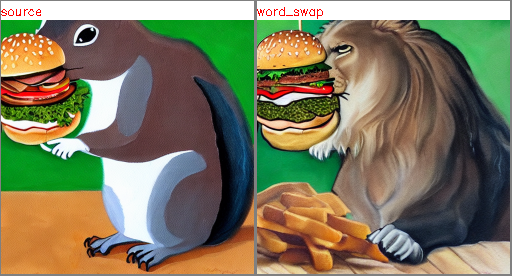

EditParams(source_prompt='A of a squirrel eating a burger', target_prompt='A of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='A of a squirrel eating a burger', target_prompt='A of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)


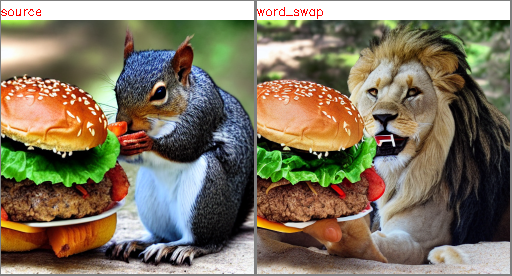

In [6]:
show_p2p_result(word_swap_edit_params_ls, word_swap_edit_res_ls, title_info=["source", "word_swap"])

## Add new phrase

In [7]:
add_new_phrase_edit_params_ls = [
    EditParams(
        source_prompt="A painting of a squirrel eating a burger",
        target_prompt="A neoclassical painting of a squirrel eating a burger", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.5, 
        self_merge_start_step=0, 
        self_merge_end_step=0.2, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None, 
    ), 
    EditParams(
        source_prompt="a photo of a house on a mountain.",
        target_prompt="a photo of a house on a mountain at fall", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.6, 
        self_merge_start_step=0, 
        self_merge_end_step=0.2, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None, 
    ), 
    EditParams(
        source_prompt="a photo of a house on a mountain.",
        target_prompt="a photo of a house on a mountain at winter", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.6, 
        self_merge_start_step=0, 
        self_merge_end_step=0.2, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None, 
    )
]
add_new_phrase_edit_res_ls: List[ImageEditResult] = [
    p2p_obj.text2image_with_control_memory_saving(edit_params) for edit_params in add_new_phrase_edit_params_ls
]
torch.cuda.empty_cache()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:16<00:00,  3.19it/s]


EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A neoclassical painting of a squirrel eating a burger', cross_merge_end_step=25, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A neoclassical painting of a squirrel eating a burger', cross_merge_end_step=25, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)


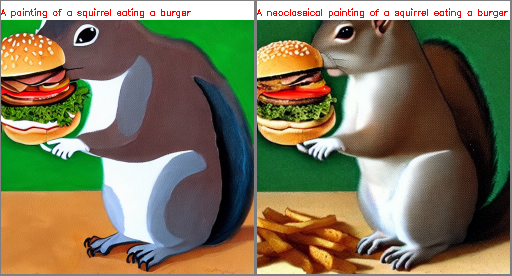

EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at fall', cross_merge_end_step=30, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at fall', cross_merge_end_step=30, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at winter', cross_merge_end_step=30, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)


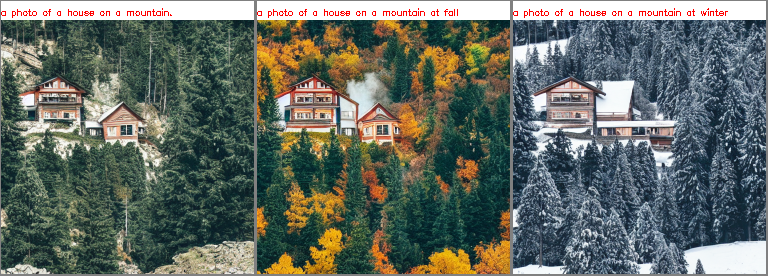

In [8]:
show_p2p_result(add_new_phrase_edit_params_ls, add_new_phrase_edit_res_ls, font_size=0.3)

## Attention Re–weighting

In [9]:
import torch
torch.cuda.empty_cache()

In [10]:
reweight_attn_edit_params_ls = []
weight_ls = [-1, -0.7, -0.4, -0.1, 0.2, 0.5, 0.8]
for cur_weight in weight_ls:
    reweight_attn_edit_params_ls.append(
        EditParams(
            source_prompt="pink bear riding a bicycle",
            target_prompt="pink bear riding a bicycle", 
            cross_merge_start_step=0,
            cross_merge_end_step=0.8, 
            self_merge_start_step=0, 
            self_merge_end_step=0.8, 
            addition_token_control_info=dict(pink=cur_weight), 
            do_noise_branch_control=False, 
            do_local_blend=True,
            blend_focus_text=["bicycle", "bicycle"]
        )
    )
    
reweight_attn_edit_res_ls: List[ImageEditResult] = [
    p2p_obj.text2image_with_control_memory_saving(edit_params) for edit_params in reweight_attn_edit_params_ls
]
torch.cuda.empty_cache()

edit with local blend: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:16<00:00,  3.17it/s]


EditParams(source_prompt='pink bear riding a bicycle', target_prompt='pink bear riding a bicycle', cross_merge_end_step=40, self_merge_end_step=40, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info={'pink': -1.0}, do_noise_branch_control=False, do_local_blend=True, blend_focus_text=['bicycle', 'bicycle'])
EditParams(source_prompt='pink bear riding a bicycle', target_prompt='pink bear riding a bicycle', cross_merge_end_step=40, self_merge_end_step=40, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info={'pink': -1.0}, do_noise_branch_control=False, do_local_blend=True, blend_focus_text=['bicycle', 'bicycle'])
EditParams(source_prompt='pink bear riding a bicycle', target_prompt='pink bear riding a bicycle', cross_merge_end_step=40, self_merge_end_step=40, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info={'pink': -0.7}, do_noise_branch_control=False, do_local_blend=True, blend_focus_text=['bicycle', 'bic

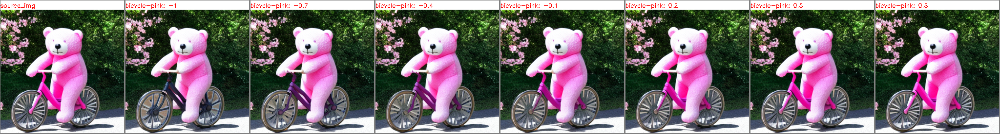

In [11]:
show_p2p_result(
    reweight_attn_edit_params_ls, 
    reweight_attn_edit_res_ls, 
    joint_show=True, title_info=["source_img", *[f"bicycle-pink: {i}" for i in weight_ls]]
)

## One more thing

### 额外引入self-attention 控制 对结果的影响

In [12]:
self_merge_end_step_ls = [0, 0.2, 0.4, 0.6, 0.8, 1.0]  # 0表示不引入self-attention 控制，1.0 表示全部时间步都引入self-attn控制
self_attn_edit_params_ls = [
    EditParams(
        source_prompt="a photo of a house on a mountain.",
        target_prompt="a photo of a house on a mountain at winter", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.6, 
        self_merge_start_step=0, 
        self_merge_end_step=i, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None,
    )
    for i in self_merge_end_step_ls
]
self_attn_edit_res_ls: List[ImageEditResult] = [
    p2p_obj.text2image_with_control_memory_saving(edit_params) for edit_params in self_attn_edit_params_ls
]
torch.cuda.empty_cache()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:16<00:00,  3.17it/s]


EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at winter', cross_merge_end_step=30, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at winter', cross_merge_end_step=30, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at winter', cross_merge_end_step=30, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditPa

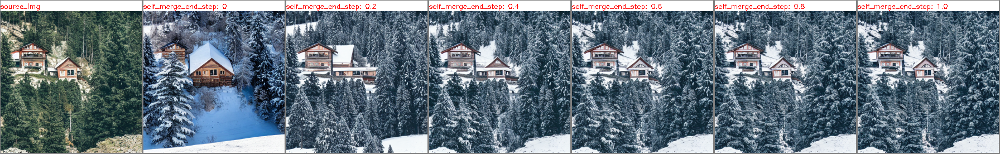

In [13]:
show_p2p_result(
    self_attn_edit_params_ls, 
    self_attn_edit_res_ls, 
    joint_show=True, title_info=["source_img", *[f"self_merge_end_step: {i}" for i in self_merge_end_step_ls]]
)

In [20]:
self_merge_end_step_ls = [0, 0.2, 0.4, 0.6, 0.8, 1.0]  # 0表示不引入self-attention 控制，1.0 表示全部时间步都引入self-attn控制
self_attn_edit_params_ls2 = [
    EditParams(
        source_prompt="A painting of a squirrel eating a burger",
        target_prompt="A painting of a lion eating a burger", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.7, 
        self_merge_start_step=0, 
        self_merge_end_step=i, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None,
    )
    for i in self_merge_end_step_ls
]
self_attn_edit_res_ls2: List[ImageEditResult] = [
    p2p_obj.text2image_with_control_memory_saving(edit_params) for edit_params in self_attn_edit_params_ls2
]
torch.cuda.empty_cache()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:16<00:00,  3.19it/s]


EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
Edi

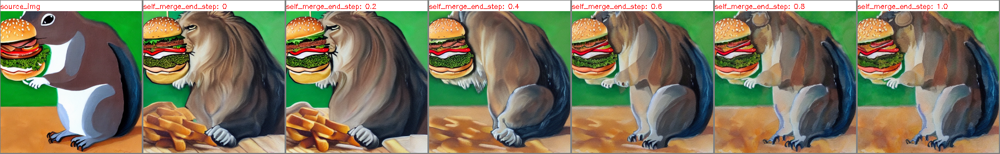

In [21]:
show_p2p_result(
    self_attn_edit_params_ls2, 
    self_attn_edit_res_ls2, 
    joint_show=True, title_info=["source_img", *[f"self_merge_end_step: {i}" for i in self_merge_end_step_ls]]
)

### 额外引入 local blend 控制 对结果的影响

In [14]:
local_blend_edit_params = [
    EditParams(
        source_prompt="a photo of a house on a mountain.",
        target_prompt="a photo of a house on a mountain at winter", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.6, 
        self_merge_start_step=0, 
        self_merge_end_step=0.2, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None,
    ),
    EditParams(
        source_prompt="a photo of a house on a mountain.",
        target_prompt="a photo of a house on a mountain at winter", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.6, 
        self_merge_start_step=0, 
        self_merge_end_step=0.2, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=True,  # 打开local blend开关
        blend_focus_text=["mountain", "mountain"],  # 编辑山
    ), 
    EditParams(
        source_prompt="soup",
        target_prompt="pea soup", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.8, 
        self_merge_start_step=0, 
        self_merge_end_step=0.4, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,  
        blend_focus_text=None,
    ),
    EditParams(
        source_prompt="soup",
        target_prompt="pea soup", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.8, 
        self_merge_start_step=0, 
        self_merge_end_step=0.4, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=True,  # 打开local blend开关
        blend_focus_text=["soup", "soup"],
    ),
    
]
local_blend_edit_res_ls: List[ImageEditResult] = [
    p2p_obj.text2image_with_control_memory_saving(edit_params) for edit_params in local_blend_edit_params
]
torch.cuda.empty_cache()

edit with local blend: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:16<00:00,  3.16it/s]


EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at winter', cross_merge_end_step=30, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at winter', cross_merge_end_step=30, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='a photo of a house on a mountain.', target_prompt='a photo of a house on a mountain at winter', cross_merge_end_step=30, self_merge_end_step=10, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=True, blend_focus_text=['mountain'

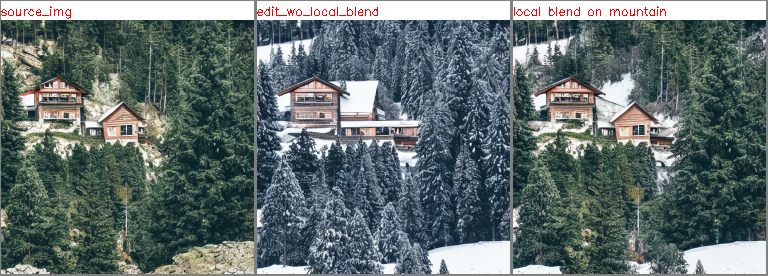

EditParams(source_prompt='soup', target_prompt='pea soup', cross_merge_end_step=40, self_merge_end_step=20, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='soup', target_prompt='pea soup', cross_merge_end_step=40, self_merge_end_step=20, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='soup', target_prompt='pea soup', cross_merge_end_step=40, self_merge_end_step=20, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=True, blend_focus_text=['soup', 'soup'])


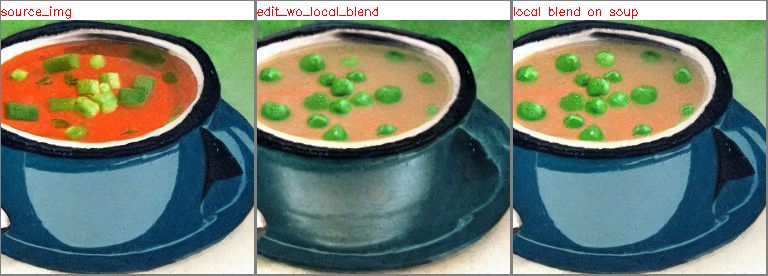

In [15]:
show_p2p_result(local_blend_edit_params, local_blend_edit_res_ls, joint_show=True, 
                title_info={
                    "soup": ["source_img", "edit_wo_local_blend", "local blend on soup"], 
                    "a photo of a house on a mountain.": ["source_img", "edit_wo_local_blend", "local blend on mountain"]
                })

## 额外引入noise 分支control 的效果

In [25]:
noise_contorl_edit_params_ls = [
    EditParams(
        source_prompt="A painting of a squirrel eating a burger",
        target_prompt="A painting of a lion eating a burger", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.7, 
        self_merge_start_step=0, 
        self_merge_end_step=0, 
        addition_token_control_info=None, 
        do_noise_branch_control=False, 
        do_local_blend=False,
        blend_focus_text=None, 
    ), 
    EditParams(
        source_prompt="A painting of a squirrel eating a burger",
        target_prompt="A painting of a lion eating a burger", 
        cross_merge_start_step=0,
        cross_merge_end_step=0.7, 
        self_merge_start_step=0, 
        self_merge_end_step=0, 
        addition_token_control_info=None, 
        do_noise_branch_control=True, 
        do_local_blend=False,
        blend_focus_text=None, 
    )
]
noise_contorl_edit_res_ls: List[ImageEditResult] = [
    p2p_obj.text2image_with_control_memory_saving(edit_params) for edit_params in noise_contorl_edit_params_ls
]
torch.cuda.empty_cache()

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:15<00:00,  3.21it/s]


EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=False, do_local_blend=False, blend_focus_text=None)
EditParams(source_prompt='A painting of a squirrel eating a burger', target_prompt='A painting of a lion eating a burger', cross_merge_end_step=35, self_merge_end_step=0, cross_merge_start_step=0, self_merge_start_step=0, addition_token_control_info=None, do_noise_branch_control=True, do_local_blend=False, blend_focus_text=None)


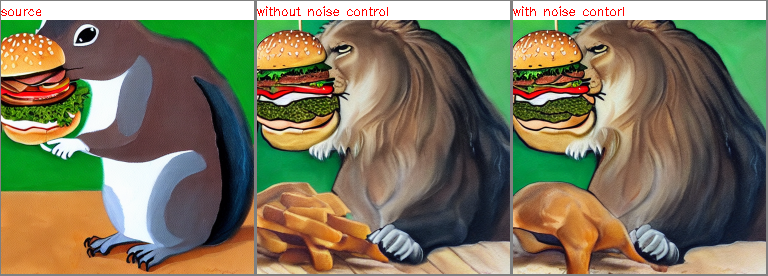

In [26]:
show_p2p_result(noise_contorl_edit_params_ls, noise_contorl_edit_res_ls, joint_show=True, 
                title_info=["source", "without noise control", "with noise contorl"]
)

## 查看cross-attention的attention map

In [16]:
@torch.no_grad()
def latent2image(latents: torch.Tensor) -> np.ndarray:
    """
    decode latent to image
    """
    latents = latents.to("cuda")
    latents = 1 / 0.18215 * latents
    image = p2p_obj.vae.decode(latents)['sample']
    image = (image / 2 + 0.5).clamp(0, 1)
    image = image.cpu().permute(0, 2, 3, 1).numpy()
    image = (image * 255).astype(np.uint8)
    return image


def show_generate_img_per_step(t2i_result: Text2ImageResult, aim_shape=None) -> List[np.ndarray]:
    img_per_step = [latent2image(i)[0] if aim_shape is None else cv2.resize(latent2image(i)[0], aim_shape) for i in t2i_result.cached_latent_with_step]
    return img_per_step


def show_token_atten_info_per_step(t2i_result: Text2ImageResult, layer_name="merge_all", attn_shape=(128, 128)) -> List[np.ndarray]:
    assert t2i_result.image.shape[0] == 1, f"not support batch now, received: {t2i_result.image.shape}"
    heat_map_info = draw_cross_attention_per_layer_all_time_step(token_ls, t2i_res.cached_attn_with_step, aim_shape=attn_shape)
    source_img = cv2.resize(t2i_result.image[0], attn_shape)
    token_attn_per_step = []
    for step_info in heat_map_info[layer_name]:
        cur_img_ls = [source_img] + list(step_info.values())
        cur_img_title_ls = ["image"] + list(step_info.keys())
        cur_concate_img = show_img_ls(img_ls=cur_img_ls, img_shape=(128, 128), text_ls=cur_img_title_ls, return_type="ndarray")
        token_attn_per_step.append(cur_concate_img)
    return token_attn_per_step

In [17]:
prompt = "A painting of a squirrel eating a burger"
token_ls = [tokenizer.decode(i) for i in tokenizer.encode(prompt)]

In [18]:
t2i_res: Text2ImageResult = p2p_obj.text2image(prompt, cached_attn_flag=True)
img_per_step = show_generate_img_per_step(t2i_res, aim_shape=(128, 128))
token_attn_per_step = show_token_atten_info_per_step(t2i_res)
torch.cuda.empty_cache()

>>>cached_attn_flag: True


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 51/51 [00:10<00:00,  5.08it/s]


MoviePy - Building file cached/img_gen_per_step.gif with imageio.


MoviePy - Building file cached/token_attn_per_step.gif with imageio.


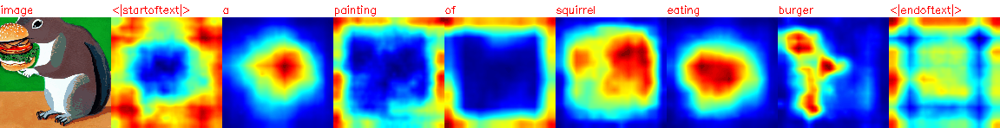

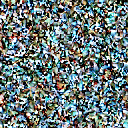

(None, None)

In [19]:
img_gen_per_step_gif_path = os.path.join("cached", "img_gen_per_step.gif")
token_attn_per_step_gif_path = os.path.join("cached", "token_attn_per_step.gif")

img_list_to_gif(img_per_step, gif_path=img_gen_per_step_gif_path)
img_list_to_gif(token_attn_per_step, gif_path=token_attn_per_step_gif_path)
show_gif(token_attn_per_step_gif_path), show_gif(img_gen_per_step_gif_path)